In [9]:
from IPython.display import display
from tqdm import tqdm
from collections import Counter
import ast

#Libraries for NLP
import nltk

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import seaborn as sns

from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE

from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

%matplotlib inline

Loading BokehJS ...

In [10]:
# !pip install textblob

In [11]:
import pickle
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer

def get_pickle_file(filepath):
    """
    load pickle file from filepath
    """
    tmp = open(filepath, "rb")
    return pickle.load(tmp)

def save_pickle_file(data, filepath="tfidf.pickle"):
    """
    save data to pickle file
    """
    pickle.dump(data, open(filepath, "wb+"))

def get_article_body(data_dict,section='Abstract'):
    """
    input is dictionary where the keys are PMIDs and the values are the paper attributes
    return dictionary where the keys are PMIDS and the values are the paper bodies
    """
    new_dict = {}
    for k,v in data_dict.items():
        new_dict[k] = v[section]
    return new_dict


def get_tfidf(corpus):
    """
    input is arr with columns = ['pmid', 'body']
    return tfidf
    """
    vectorizer = TfidfVectorizer(ngram_range=(1,1), max_features=500, 
                                 max_df=0.02,min_df=.0005)
    X = vectorizer.fit_transform(corpus)
    # vocab = vectorizer.vocabulary_
    feature_name = vectorizer.get_feature_names()
    return X, feature_name

def assemble_results(pmids, tfidf):
    """
    inputs are 1 dimensional arrays with n rows
    output is array with both inputs as columns
    """
    return np.concatenate((np.expand_dims(list(pmids), axis=1), np.expand_dims(list(tfidf), axis=1)), axis=1)

if __name__ == "__main__":
    """
    take in sample_v2.pickle and return pickle file with ["pmid","tfidf"]
    """

    data_dict = get_pickle_file("Downloads/abstract.pickle")
    paper_body_dict = get_article_body(data_dict)
    print("bodies collected...")

    # i = 0
    # new_dict = {}
    # for k,v in paper_body_dict.items():
    #     if i < 50:
    #         new_dict[k] = v
    #         i += 1
    #     else:
    #         break

    pmids = paper_body_dict.keys()
    corpus = paper_body_dict.values()
    print("transformed to array...")

    X, feature_name = get_tfidf(corpus)
    print("tfidf calculated...")

    pmid_tfidf_array = assemble_results(pmids, X)
    save_pickle_file(pmid_tfidf_array)
    print("done")

bodies collected...
transformed to array...
tfidf calculated...
done


In [12]:
type(paper_body_dict)

dict

In [13]:
#Function to get top words and counts
def get_top_n_words(n_top_words, count_vectorizer, text_data):
    '''
    returns a tuple of the top n words in a sample and their 
    accompanying counts, given a CountVectorizer object and text sample
    '''
    vectorized_headlines = count_vectorizer.fit_transform(text_data.values())
    vectorized_total = np.sum(vectorized_headlines, axis=0)
    word_indices = np.flip(np.argsort(vectorized_total)[0,:], 1)
    word_values = np.flip(np.sort(vectorized_total)[0,:],1)
    
    word_vectors = np.zeros((n_top_words, vectorized_headlines.shape[1]))
    for i in range(n_top_words):
        word_vectors[i,word_indices[0,i]] = 1

    words = [word[0].encode('ascii').decode('utf-8') for 
             word in count_vectorizer.inverse_transform(word_vectors)]

    return (words, word_values[0,:n_top_words].tolist()[0])

In [14]:
# l_corp = list(corpus)

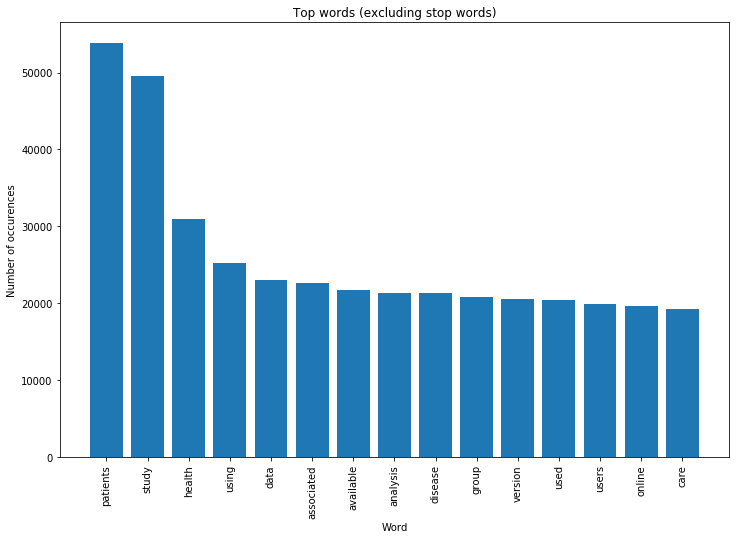

range(0, 15)


In [15]:
cv = CountVectorizer(stop_words='english')
words, word_val = get_top_n_words(n_top_words=15, count_vectorizer=cv, text_data=paper_body_dict)
fig, ax = plt.subplots(figsize=(12, 8))
ax.bar(words, word_val)
ax.set_xticklabels(words, rotation='vertical');
ax.set_title('Top words (excluding stop words)');
ax.set_xlabel('Word');
ax.set_ylabel('Number of occurences');
plt.show()
print(range(len(words)))

In [16]:
#Making a class for both tokenization and lemmatization
lemm = nltk.WordNetLemmatizer()
class LemmaCountVectorizer(CountVectorizer):
    def build_analyzer(self):
        analyzer = super(LemmaCountVectorizer, self).build_analyzer()
        return lambda doc: (lemm.lemmatize(w) for w in analyzer(doc))

In [17]:
# ls_corp = list(corpus)
# words = []
# for x in range(len(corpus)):
#     words.append(ls_corp[x].split())

In [18]:
text = list(paper_body_dict.values())

# Calling the overwritten count vectorizer
tf_vectorizer = LemmaCountVectorizer(max_df=0.75, min_df=3, stop_words='english', 
                                     decode_error='ignore')
tf = tf_vectorizer.fit_transform(text)

In [19]:
#number of topics
n_topics=12

In [20]:
#Creating an LDA instance
lda = LatentDirichletAllocation(n_components=n_topics, max_iter=5, learning_method='online', 
                                learning_offset=50., random_state=0, verbose =0)
lda.fit(tf)

#Making an LDA topic matrix of the corpus
lda_topic_matrix = lda.fit_transform(tf)

In [21]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [22]:
# Getting the categories and counts from the lda model
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [23]:
# lda_keys

In [24]:
# Function to get top words from each category
def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
        topic_words = []
        for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
        top_words.append(" ".join(topic_words))         
    return top_words

In [25]:
# tf

In [26]:
# Printing words from each topic
top_n_words = get_top_n_words(20, lda_keys, tf, tf_vectorizer)

for i in range(len(top_n_words)):
    print("Topic {}:\n ".format(i), top_n_words[i] + "\n")

Topic 0:
  health study physical activity patient care group participant intervention factor associated disorder analysis using data woman level mental life risk

Topic 1:
  gene expression analysis study protein genome identified cell available genetic plant using contains material version online article sequence user supplementary

Topic 2:
  patient study treatment group risk outcome care disease year rate data clinical associated analysis therapy factor using mortality age health

Topic 3:
  study strain isolates gene production resistance acid activity plant using specie infection high analysis showed used concentration different result antimicrobial

Topic 4:
  patient disease study kidney group level index risk body associated diabetes mass blood chronic pressure factor higher age significantly association

Topic 5:
  supplementary material available version contains online article user authorized registered trial doi registration retrospectively gov clinicaltrials number study 

In [13]:
#Transforming the LDA topic matrix to 2 dimensions for plotting
tsne_lda_model = TSNE(n_components=2, perplexity=100, learning_rate=100, 
                        n_iter=5000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 47854 samples in 0.279s...
[t-SNE] Computed neighbors for 47854 samples in 24.683s...
[t-SNE] Computed conditional probabilities for sample 1000 / 47854
[t-SNE] Computed conditional probabilities for sample 2000 / 47854
[t-SNE] Computed conditional probabilities for sample 3000 / 47854
[t-SNE] Computed conditional probabilities for sample 4000 / 47854
[t-SNE] Computed conditional probabilities for sample 5000 / 47854
[t-SNE] Computed conditional probabilities for sample 6000 / 47854
[t-SNE] Computed conditional probabilities for sample 7000 / 47854
[t-SNE] Computed conditional probabilities for sample 8000 / 47854
[t-SNE] Computed conditional probabilities for sample 9000 / 47854
[t-SNE] Computed conditional probabilities for sample 10000 / 47854
[t-SNE] Computed conditional probabilities for sample 11000 / 47854
[t-SNE] Computed conditional probabilities for sample 12000 / 47854
[t-SNE] Computed conditional probabilities for s

In [27]:
# Define helper functions
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [28]:
# Colourmap for the visualization
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [16]:
#Top 3 word from each topic to use in plot
top_3_words_lda = get_top_n_words(3, lda_keys, tf, tf_vectorizer)

#Getting the mean of the topic vector for the visualization
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

#Creating the t-SNE plot
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=600, plot_height=600)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)

In [17]:
#Transforming the LDA topic matrix to 2 dimensions for plotting
tsne_lda_model = TSNE(n_components=2, perplexity=10, learning_rate=100, 
                        n_iter=5000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 47854 samples in 0.680s...
[t-SNE] Computed neighbors for 47854 samples in 20.044s...
[t-SNE] Computed conditional probabilities for sample 1000 / 47854
[t-SNE] Computed conditional probabilities for sample 2000 / 47854
[t-SNE] Computed conditional probabilities for sample 3000 / 47854
[t-SNE] Computed conditional probabilities for sample 4000 / 47854
[t-SNE] Computed conditional probabilities for sample 5000 / 47854
[t-SNE] Computed conditional probabilities for sample 6000 / 47854
[t-SNE] Computed conditional probabilities for sample 7000 / 47854
[t-SNE] Computed conditional probabilities for sample 8000 / 47854
[t-SNE] Computed conditional probabilities for sample 9000 / 47854
[t-SNE] Computed conditional probabilities for sample 10000 / 47854
[t-SNE] Computed conditional probabilities for sample 11000 / 47854
[t-SNE] Computed conditional probabilities for sample 12000 / 47854
[t-SNE] Computed conditional probabilities for sa

In [18]:
#Top 3 word from each topic to use in plot
top_3_words_lda = get_top_n_words(4, lda_keys, tf, tf_vectorizer)

#Getting the mean of the topic vector for the visualization
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

#Creating the t-SNE plot
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=600, plot_height=600)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)

In [19]:
#Transforming the LDA topic matrix to 2 dimensions for plotting
tsne_lda_model = TSNE(n_components=2, perplexity=1, learning_rate=100, 
                        n_iter=5000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

[t-SNE] Computing 4 nearest neighbors...
[t-SNE] Indexed 47854 samples in 0.249s...
[t-SNE] Computed neighbors for 47854 samples in 6.822s...
[t-SNE] Computed conditional probabilities for sample 1000 / 47854
[t-SNE] Computed conditional probabilities for sample 2000 / 47854
[t-SNE] Computed conditional probabilities for sample 3000 / 47854
[t-SNE] Computed conditional probabilities for sample 4000 / 47854
[t-SNE] Computed conditional probabilities for sample 5000 / 47854
[t-SNE] Computed conditional probabilities for sample 6000 / 47854
[t-SNE] Computed conditional probabilities for sample 7000 / 47854
[t-SNE] Computed conditional probabilities for sample 8000 / 47854
[t-SNE] Computed conditional probabilities for sample 9000 / 47854
[t-SNE] Computed conditional probabilities for sample 10000 / 47854
[t-SNE] Computed conditional probabilities for sample 11000 / 47854
[t-SNE] Computed conditional probabilities for sample 12000 / 47854
[t-SNE] Computed conditional probabilities for samp

In [20]:
#Top 3 word from each topic to use in plot
top_3_words_lda = get_top_n_words(4, lda_keys, tf, tf_vectorizer)

#Getting the mean of the topic vector for the visualization
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

#Creating the t-SNE plot
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=600, plot_height=600)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)

In [21]:
#Transforming the LDA topic matrix to 2 dimensions for plotting
tsne_lda_model = TSNE(n_components=2, perplexity=5, learning_rate=100, 
                        n_iter=5000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 47854 samples in 0.257s...
[t-SNE] Computed neighbors for 47854 samples in 7.762s...
[t-SNE] Computed conditional probabilities for sample 1000 / 47854
[t-SNE] Computed conditional probabilities for sample 2000 / 47854
[t-SNE] Computed conditional probabilities for sample 3000 / 47854
[t-SNE] Computed conditional probabilities for sample 4000 / 47854
[t-SNE] Computed conditional probabilities for sample 5000 / 47854
[t-SNE] Computed conditional probabilities for sample 6000 / 47854
[t-SNE] Computed conditional probabilities for sample 7000 / 47854
[t-SNE] Computed conditional probabilities for sample 8000 / 47854
[t-SNE] Computed conditional probabilities for sample 9000 / 47854
[t-SNE] Computed conditional probabilities for sample 10000 / 47854
[t-SNE] Computed conditional probabilities for sample 11000 / 47854
[t-SNE] Computed conditional probabilities for sample 12000 / 47854
[t-SNE] Computed conditional probabilities for sam

In [22]:
#Top 3 word from each topic to use in plot
top_3_words_lda = get_top_n_words(4, lda_keys, tf, tf_vectorizer)

#Getting the mean of the topic vector for the visualization
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

#Creating the t-SNE plot
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=600, plot_height=600)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)

In [23]:
#Transforming the LDA topic matrix to 2 dimensions for plotting
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=5000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 47854 samples in 0.328s...
[t-SNE] Computed neighbors for 47854 samples in 18.715s...
[t-SNE] Computed conditional probabilities for sample 1000 / 47854
[t-SNE] Computed conditional probabilities for sample 2000 / 47854
[t-SNE] Computed conditional probabilities for sample 3000 / 47854
[t-SNE] Computed conditional probabilities for sample 4000 / 47854
[t-SNE] Computed conditional probabilities for sample 5000 / 47854
[t-SNE] Computed conditional probabilities for sample 6000 / 47854
[t-SNE] Computed conditional probabilities for sample 7000 / 47854
[t-SNE] Computed conditional probabilities for sample 8000 / 47854
[t-SNE] Computed conditional probabilities for sample 9000 / 47854
[t-SNE] Computed conditional probabilities for sample 10000 / 47854
[t-SNE] Computed conditional probabilities for sample 11000 / 47854
[t-SNE] Computed conditional probabilities for sample 12000 / 47854
[t-SNE] Computed conditional probabilities for s

In [24]:
#Top 3 word from each topic to use in plot
top_3_words_lda = get_top_n_words(5, lda_keys, tf, tf_vectorizer)

#Getting the mean of the topic vector for the visualization
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

#Creating the t-SNE plot
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=600, plot_height=600)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)

In [25]:
#Transforming the LDA topic matrix to 2 dimensions for plotting
tsne_lda_model = TSNE(n_components=2, perplexity=100, learning_rate=100, 
                        n_iter=5000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 47854 samples in 0.390s...
[t-SNE] Computed neighbors for 47854 samples in 22.344s...
[t-SNE] Computed conditional probabilities for sample 1000 / 47854
[t-SNE] Computed conditional probabilities for sample 2000 / 47854
[t-SNE] Computed conditional probabilities for sample 3000 / 47854
[t-SNE] Computed conditional probabilities for sample 4000 / 47854
[t-SNE] Computed conditional probabilities for sample 5000 / 47854
[t-SNE] Computed conditional probabilities for sample 6000 / 47854
[t-SNE] Computed conditional probabilities for sample 7000 / 47854
[t-SNE] Computed conditional probabilities for sample 8000 / 47854
[t-SNE] Computed conditional probabilities for sample 9000 / 47854
[t-SNE] Computed conditional probabilities for sample 10000 / 47854
[t-SNE] Computed conditional probabilities for sample 11000 / 47854
[t-SNE] Computed conditional probabilities for sample 12000 / 47854
[t-SNE] Computed conditional probabilities for s

In [ ]:
#Top 3 word from each topic to use in plot
top_3_words_lda = get_top_n_words(5, lda_keys, tf, tf_vectorizer)

#Getting the mean of the topic vector for the visualization
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

#Creating the t-SNE plot
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=600, plot_height=600)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)

In [29]:
#Transforming the LDA topic matrix to 2 dimensions for plotting
tsne_lda_model = TSNE(n_components=2, perplexity=200, learning_rate=100, 
                        n_iter=5000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

[t-SNE] Computing 601 nearest neighbors...
[t-SNE] Indexed 47854 samples in 0.309s...
[t-SNE] Computed neighbors for 47854 samples in 34.787s...
[t-SNE] Computed conditional probabilities for sample 1000 / 47854
[t-SNE] Computed conditional probabilities for sample 2000 / 47854
[t-SNE] Computed conditional probabilities for sample 3000 / 47854
[t-SNE] Computed conditional probabilities for sample 4000 / 47854
[t-SNE] Computed conditional probabilities for sample 5000 / 47854
[t-SNE] Computed conditional probabilities for sample 6000 / 47854
[t-SNE] Computed conditional probabilities for sample 7000 / 47854
[t-SNE] Computed conditional probabilities for sample 8000 / 47854
[t-SNE] Computed conditional probabilities for sample 9000 / 47854
[t-SNE] Computed conditional probabilities for sample 10000 / 47854
[t-SNE] Computed conditional probabilities for sample 11000 / 47854
[t-SNE] Computed conditional probabilities for sample 12000 / 47854
[t-SNE] Computed conditional probabilities for s

In [30]:
#Top 3 word from each topic to use in plot
top_3_words_lda = get_top_n_words(4, lda_keys, tf, tf_vectorizer)

#Getting the mean of the topic vector for the visualization
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

#Creating the t-SNE plot
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=600, plot_height=600)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)

In [31]:
#Transforming the LDA topic matrix to 2 dimensions for plotting
tsne_lda_model = TSNE(n_components=2, perplexity=300, learning_rate=100, 
                        n_iter=5000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

[t-SNE] Computing 901 nearest neighbors...
[t-SNE] Indexed 47854 samples in 0.365s...
[t-SNE] Computed neighbors for 47854 samples in 41.299s...
[t-SNE] Computed conditional probabilities for sample 1000 / 47854
[t-SNE] Computed conditional probabilities for sample 2000 / 47854
[t-SNE] Computed conditional probabilities for sample 3000 / 47854
[t-SNE] Computed conditional probabilities for sample 4000 / 47854
[t-SNE] Computed conditional probabilities for sample 5000 / 47854
[t-SNE] Computed conditional probabilities for sample 6000 / 47854
[t-SNE] Computed conditional probabilities for sample 7000 / 47854
[t-SNE] Computed conditional probabilities for sample 8000 / 47854
[t-SNE] Computed conditional probabilities for sample 9000 / 47854
[t-SNE] Computed conditional probabilities for sample 10000 / 47854
[t-SNE] Computed conditional probabilities for sample 11000 / 47854
[t-SNE] Computed conditional probabilities for sample 12000 / 47854
[t-SNE] Computed conditional probabilities for s

In [32]:
#Top 3 word from each topic to use in plot
top_3_words_lda = get_top_n_words(4, lda_keys, tf, tf_vectorizer)

#Getting the mean of the topic vector for the visualization
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

#Creating the t-SNE plot
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=600, plot_height=600)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)

In [33]:
#Transforming the LDA topic matrix to 2 dimensions for plotting
tsne_lda_model = TSNE(n_components=2, perplexity=400, learning_rate=100, 
                        n_iter=5000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

[t-SNE] Computing 1201 nearest neighbors...
[t-SNE] Indexed 47854 samples in 0.313s...
[t-SNE] Computed neighbors for 47854 samples in 41.748s...
[t-SNE] Computed conditional probabilities for sample 1000 / 47854
[t-SNE] Computed conditional probabilities for sample 2000 / 47854
[t-SNE] Computed conditional probabilities for sample 3000 / 47854
[t-SNE] Computed conditional probabilities for sample 4000 / 47854
[t-SNE] Computed conditional probabilities for sample 5000 / 47854
[t-SNE] Computed conditional probabilities for sample 6000 / 47854
[t-SNE] Computed conditional probabilities for sample 7000 / 47854
[t-SNE] Computed conditional probabilities for sample 8000 / 47854
[t-SNE] Computed conditional probabilities for sample 9000 / 47854
[t-SNE] Computed conditional probabilities for sample 10000 / 47854
[t-SNE] Computed conditional probabilities for sample 11000 / 47854
[t-SNE] Computed conditional probabilities for sample 12000 / 47854
[t-SNE] Computed conditional probabilities for 

KeyboardInterrupt: 

In [ ]:
#Top 3 word from each topic to use in plot
top_3_words_lda = get_top_n_words(4, lda_keys, tf, tf_vectorizer)

#Getting the mean of the topic vector for the visualization
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

#Creating the t-SNE plot
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=600, plot_height=600)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)

In [ ]:
#Transforming the LDA topic matrix to 2 dimensions for plotting
tsne_lda_model = TSNE(n_components=2, perplexity=500, learning_rate=100, 
                        n_iter=5000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

In [ ]:
#Top 3 word from each topic to use in plot
top_3_words_lda = get_top_n_words(4, lda_keys, tf, tf_vectorizer)

#Getting the mean of the topic vector for the visualization
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

#Creating the t-SNE plot
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=600, plot_height=600)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)

In [ ]:
#Transforming the LDA topic matrix to 2 dimensions for plotting
tsne_lda_model = TSNE(n_components=2, perplexity=500, learning_rate=100, 
                        n_iter=5000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

In [ ]:
#Top 3 word from each topic to use in plot
top_3_words_lda = get_top_n_words(4, lda_keys, tf, tf_vectorizer)

#Getting the mean of the topic vector for the visualization
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

#Creating the t-SNE plot
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=600, plot_height=600)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)

In [ ]:
#Transforming the LDA topic matrix to 2 dimensions for plotting
tsne_lda_model = TSNE(n_components=2, perplexity=750, learning_rate=100, 
                        n_iter=5000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

In [ ]:
#Top 3 word from each topic to use in plot
top_3_words_lda = get_top_n_words(4, lda_keys, tf, tf_vectorizer)

#Getting the mean of the topic vector for the visualization
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

#Creating the t-SNE plot
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=600, plot_height=600)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)

In [ ]:
#Transforming the LDA topic matrix to 2 dimensions for plotting
tsne_lda_model = TSNE(n_components=2, perplexity=1000, learning_rate=100, 
                        n_iter=5000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

In [ ]:
#Top 3 word from each topic to use in plot
top_3_words_lda = get_top_n_words(4, lda_keys, tf, tf_vectorizer)

#Getting the mean of the topic vector for the visualization
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

#Creating the t-SNE plot
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=600, plot_height=600)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color=colormap[t])
    plot.add_layout(label)

show(plot)